# 3D Sensing & Sensor Fusion  - 1st assignment - Stereo matching

## Imports

In [1]:
import sys
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compare_ssim, mean_squared_error
from numba import njit, prange

## Parameters

### Camera intrinsic parameters

In [2]:
focal_length = 3740
baseline = 160

### Stereo estimation parameters

In [3]:
dmin = 200
window_size = 3
weight = 1000
scale = 3

### Input & output parameters

In [4]:
set = 'Art'
image1_path = f'datasets/{set}/view1.png'
image2_path = f'datasets/{set}/view5.png'

ground_truth1_path = f'datasets/{set}/disp1.png'
ground_truth2_path = f'datasets/{set}/disp5.png'

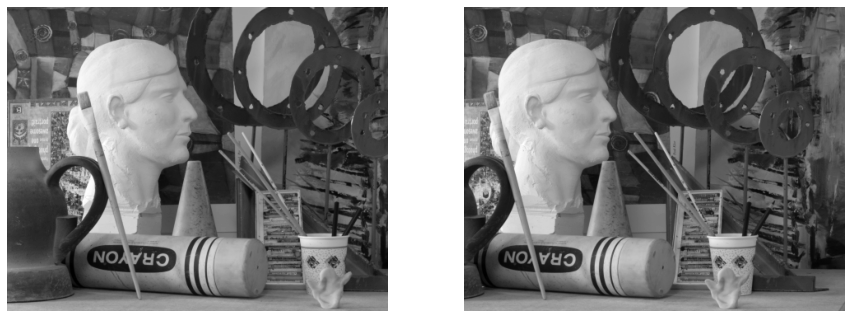

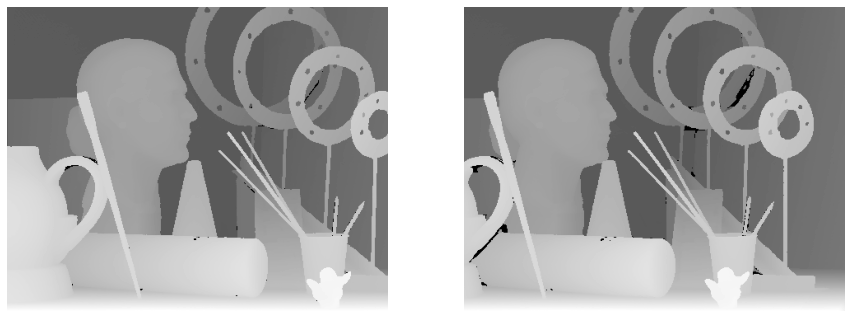

In [5]:
image1 = cv2.imread(image1_path, cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(image2_path, cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(ground_truth1_path, cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(ground_truth2_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(15, 8))
i = 0
for image in [image1, image2]:
  plt.subplot(1, 2, i+1)
  plt.axis('off')
  _ = plt.imshow(image, cmap='gray')
  i += 1

i = 0
plt.figure(figsize=(15, 8))
for image in [gt1, gt2]:
  plt.subplot(1, 2, i+1)
  plt.axis('off')
  _ = plt.imshow(image, cmap='gray')
  i += 1

In [6]:
height = image1.shape[0]
width = image1.shape[1]

print('------------------ Parameters -------------------')
print(f'focal_length = {focal_length}')
print(f'baseline = {baseline}')
print(f'window_size = {window_size}')
print(f'occlusion weights = {weight}')
print(f'disparity added due to image cropping = {dmin}')
print(f'scaling of disparity images to show = {scale}')
print(f'image dimensions = {width}x{height}')
print('-------------------------------------------------')

------------------ Parameters -------------------
focal_length = 3740
baseline = 160
window_size = 3
occlusion weights = 1000
disparity added due to image cropping = 200
scaling of disparity images to show = 3
image dimensions = 463x370
-------------------------------------------------


## Subtask 1

### Naive approach

In [7]:
@njit(parallel=True, fastmath=True)
def stereo_estimation_naive(window_size, height, width, image1, image2, scale, metric=1):
  half_window = window_size // 2
  naive_disparities = np.zeros((height, width), np.uint8)
  c = 1e-8

  for i in prange(half_window, height-half_window):
    for j in range(half_window, width-half_window):
      min_cost = sys.maxsize
      disparity = 0
      
      for d in range(-j+half_window, width-j-half_window):
        image1_window = image1[i-half_window:i+half_window+1, j-half_window:j+half_window+1]
        image2_window = image2[i-half_window:i+half_window+1, j-half_window+d:j+half_window+1+d]

        if metric == 1: # SSD
          cost = np.sum(np.square(image1_window - image2_window))
        
        if metric == 2: # SSIM
          mu_1 = np.mean(image1_window)
          mu_2 = np.mean(image2_window)
          cov = np.mean((image1_window - mu_1) * (image2_window - mu_2))

          ssim = ((2 * mu_1 * mu_2 + c) * (2 * cov + c)) / \
                 ((np.square(mu_1) + np.square(mu_2) + c) * (np.square(np.std(image1_window)) + np.square(np.std(image2_window)) + c))
          cost = -ssim
        
        if metric == 3: # NCC
          image1_window = (image1_window - np.mean(image1_window)) / (np.std(image1_window) + c)
          image2_window = (image2_window - np.mean(image2_window)) / (np.std(image2_window) + c)

          cost = -np.sum(image1_window * image2_window)

        if cost < min_cost:
          min_cost = cost
          disparity = d
        
      naive_disparities[i-half_window, j-half_window] = abs(disparity) * scale
  return naive_disparities

In [8]:
naive_params = dict(
  window_size=window_size,
  height=height,
  width=width,
  image1=image1,
  image2=image2,
  scale=scale,
  metric=1,
)

naive_start = time.time()
naive_disparities_SSD = stereo_estimation_naive(**naive_params)
naive_end = time.time()
naive_exec_time_SSD = naive_end - naive_start

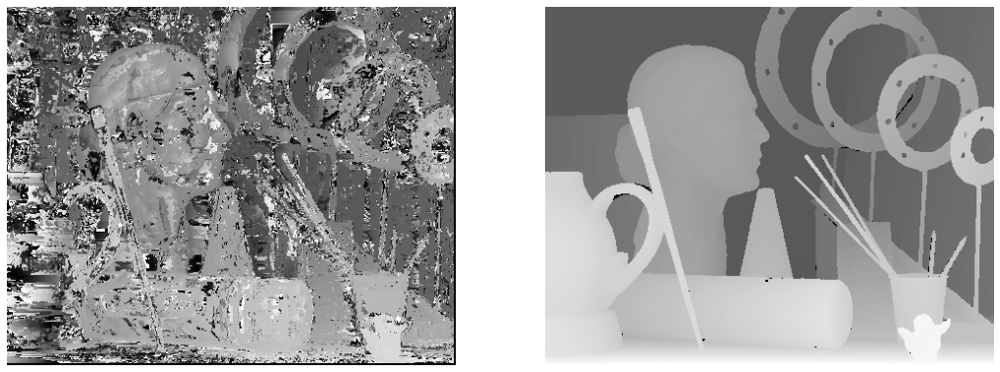

In [9]:
plt.figure(figsize=(18, 10))
i = 0
for image in [naive_disparities_SSD, gt1]:
  plt.subplot(1, 2, i+1)
  plt.axis('off')
  _ = plt.imshow(image, cmap='gray')
  i += 1

### Dynamical programming approach

In [10]:
@njit(parallel=True, fastmath=True)
def stereo_estimation_dp(window_size, height, width, image1, image2, scale, occlusion, metric=1):
  half = window_size // 2
  dp_disparities = np.zeros((height, width), np.uint8)
  c = 1e-8

  for x in prange(half, height-half):
    _c = np.zeros((width, width), np.float64)
    _m = np.ones((width, width), np.uint8)

    for i in prange(width):
      _c[i, 0] = i * occlusion
      _c[0, i] = i * occlusion

    for i in prange(half, width-half):
      for j in range(half, width-half):
        image1_window = image1[x-half:x+half+1, i-half:i+half+1]
        image2_window = image2[x-half:x+half+1, j-half:j+half+1]

        if metric == 1: # SSD
          cost = np.sum(np.square(image1_window - image2_window))
        
        if metric == 2: # SSIM
          mu_1 = np.mean(image1_window)
          mu_2 = np.mean(image2_window)
          cov = np.mean((image1_window - mu_1) * (image2_window - mu_2))

          ssim = ((2 * mu_1 * mu_2 + c) * (2 * cov + c)) / \
                 ((np.square(mu_1) + np.square(mu_2) + c) * (np.square(np.std(image1_window)) + np.square(np.std(image2_window)) + c))
          cost = -ssim
        
        if metric == 3: # NCC
          image1_window = (image1_window - np.mean(image1_window)) / (np.std(image1_window) + c)
          image2_window = (image2_window - np.mean(image2_window)) / (np.std(image2_window) + c)

          cost = -np.sum(image1_window * image2_window)

        min1 = _c[i-1, j-1] + cost
        min2 = _c[i-1, j] + occlusion
        min3 = _c[i, j-1] + occlusion

        _min = min(min1, min2, min3)
        _c[i, j] = _min

        if _min == min1:
          _m[i, j] = 1
        elif _min == min2:
          _m[i, j] = 2
        elif _min == min3:
          _m[i, j] = 3

    p = width-1
    q = width-1

    while p != 0 and q != 0:
      if _m[p, q] == 1:
        dp_disparities[x, p] = abs(p - q) * scale
        p -= 1
        q -= 1
      elif _m[p, q] == 2:
        p -= 1
      elif _m[p, q] == 3:
        q -= 1

  for i in range(height):
    for j in range(width):
      if dp_disparities[i, j] == 0:
        left_j = j - 1
        while left_j >= 0:
          if left_j >= 0 and dp_disparities[i, left_j] != 0:
            dp_disparities[i, j] = dp_disparities[i, left_j]
            break
          left_j -= 1

  return dp_disparities

In [11]:
dp_params = dict(
  window_size=window_size,
  height=height,
  width=width,
  image1=image1,
  image2=image2,
  scale=scale,
  occlusion=1000,
  metric=1,
)

dp_start = time.time()
dp_disparities_SSD = stereo_estimation_dp(**dp_params)
dp_end = time.time()
dp_exec_time_SSD = dp_end - dp_start

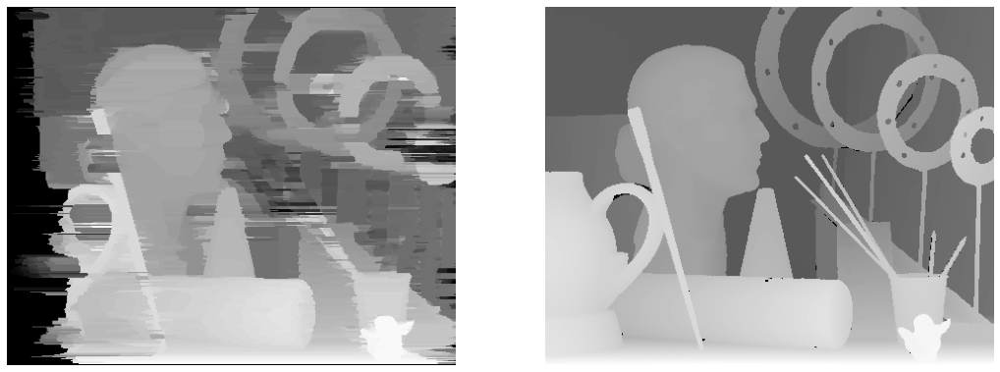

In [12]:
plt.figure(figsize=(18, 10))
i = 0
for image in [dp_disparities_SSD, gt1]:
  plt.subplot(1, 2, i+1)
  plt.axis('off')
  _ = plt.imshow(image, cmap='gray')
  i += 1

## Subtask 2

> Note: the Y coordinate is negated, because Meshlab uses different coordinate system.

In [13]:
def disparity_to_point_cloud(out_path, original_image, disparities, width, height, dmin, baseline, focal_length, scale):
  focal_length = focal_length // scale
  file = open(out_path, 'w+')

  for i in range(height):
    for j in range(width):
      if (disparities[i,j] == 0):
        continue

      z = (baseline * focal_length) / (int(disparities[i,j] / scale) + dmin)
      x = (i * z) / focal_length
      y = (j * z) / focal_length

      file.write(f'{x} {-y} {z} {original_image[i,j,2]} {original_image[i,j,1]} {original_image[i,j,0]}\n')
  

  file.close()

naive_output_pc_path = f'{set}_naive.txt'
dp_output_pc_path = f'{set}_dp.txt'
original_image = cv2.imread(image1_path)

disparity_to_point_cloud(naive_output_pc_path, original_image, naive_disparities_SSD, width, height, dmin, baseline, focal_length, scale)
disparity_to_point_cloud(dp_output_pc_path, original_image, dp_disparities_SSD, width, height, dmin, baseline, focal_length, scale)

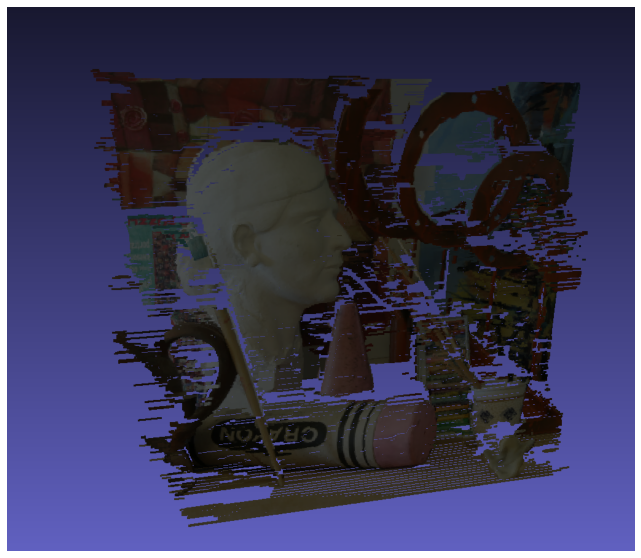

In [14]:
display = cv2.imread('./Art_dp_screenshot.png')
plt.figure(figsize=(18, 10))
plt.axis('off')
_ = plt.imshow(display[:,:,::-1])

## Subtask 3

In [15]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

### Utils

In [16]:
def plot_original_images(image1, image2):
  plt.figure(figsize=(15, 8))
  i = 0
  for image in [image1, image2]:
    plt.subplot(1, 2, i+1)
    plt.axis('off')
    _ = plt.imshow(image, cmap='gray')
    i += 1

def plot_disparities(results):
  plt.figure(figsize=(16, 12))
  
  col = 0
  for i in range(3):
    if i == 0:
      rowName = 'SSD'
    elif i == 1:
      rowName = 'SSIM'
    elif i == 2:
      rowName = 'NCC'

    for image in results[i]:
      plt.subplot(3, 3, col+1)

      if col % 3 == 0:
        plt.title(f'Naive - {rowName}')
      elif col % 3 == 1:
        plt.title(f'DP - {rowName}')
      elif col % 3 == 2:
        plt.title('Ground truth')

      plt.axis('off')
      _ = plt.imshow(image, cmap='gray')
      col += 1

def plot_difference_images(results):
  plt.figure(figsize=(16, 12))

  col = 0
  for i in range(3):
    if i == 0:
      rowName = 'SSD'
    elif i == 1:
      rowName = 'SSIM'
    elif i == 2:
      rowName = 'NCC'

    for image in results[i]:
      plt.subplot(3, 3, col+1)

      if col % 3 == 0:
        plt.title(f'Naive - {rowName}')
      elif col % 3 == 1:
        plt.title(f'DP - {rowName}')
      elif col % 3 == 2:
        plt.title('Ground truth')

      plt.axis('off')
      _ = plt.imshow(image, cmap='gray')
      col += 1
  

### Execution times

> Note: All execution time includes the Numba compilation time too!

In [17]:
# SSIM
naive_start = time.time()
naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
naive_end = time.time()
naive_exec_time_SSIM = naive_end - naive_start

dp_start = time.time()
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)
dp_end = time.time()
dp_exec_time_SSIM = dp_end - dp_start

# NCC
naive_start = time.time()
naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
naive_end = time.time()
naive_exec_time_NCC = naive_end - naive_start

dp_start = time.time()
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)
dp_end = time.time()
dp_exec_time_NCC = dp_end - dp_start

Image size:  (370, 463)


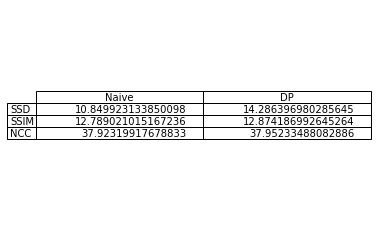

In [18]:
print(f'Image size: ', image1.shape)

fig, ax =plt.subplots(1,1)
data=[[naive_exec_time_SSD, dp_exec_time_SSD],
      [naive_exec_time_SSIM, dp_exec_time_SSIM],
      [naive_exec_time_NCC, dp_exec_time_NCC]]

column_labels=['Naive', 'DP']
rowLabels=['SSD', 'SSIM', 'NCC']
ax.axis('tight')
ax.axis('off')
_ = ax.table(cellText=data, colLabels=column_labels, rowLabels=rowLabels, loc='center')

### 2005 - Art dataset

In [19]:
set = 'Art'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

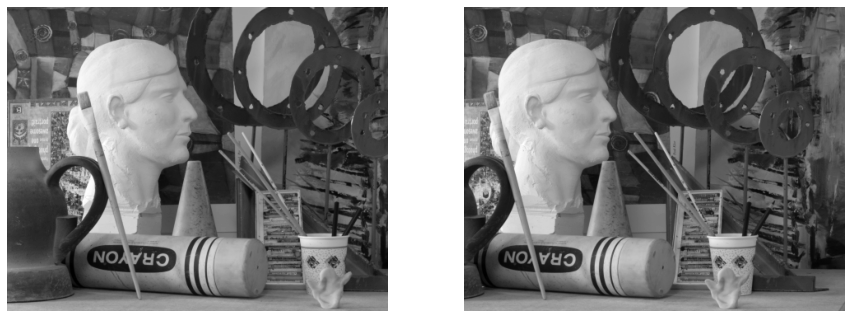

In [20]:
plot_original_images(image1, image2)

#### Quality of disparity maps

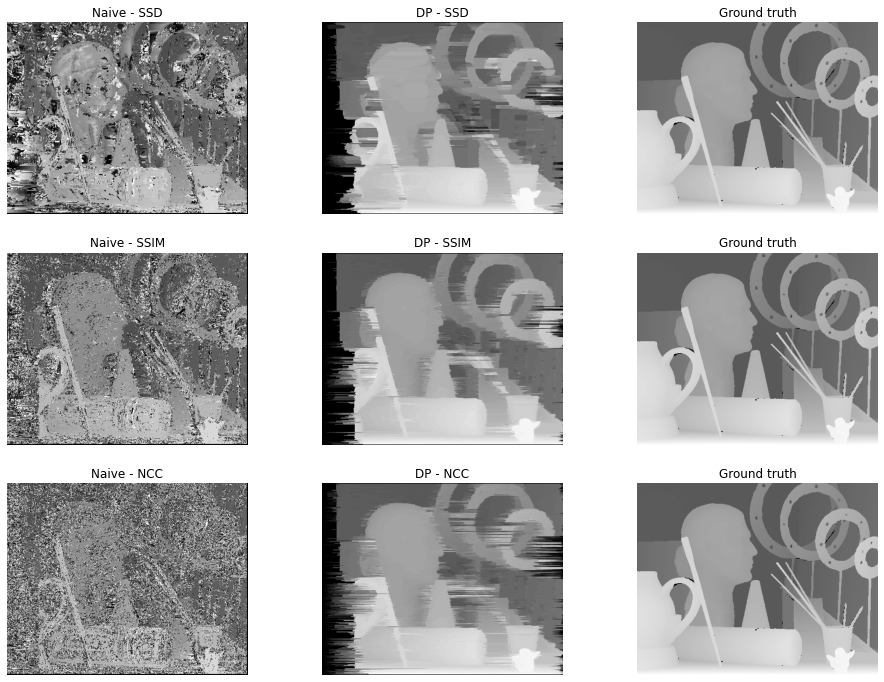

In [21]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

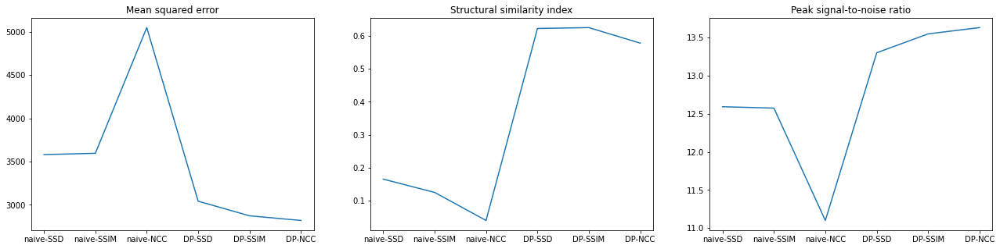

In [22]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

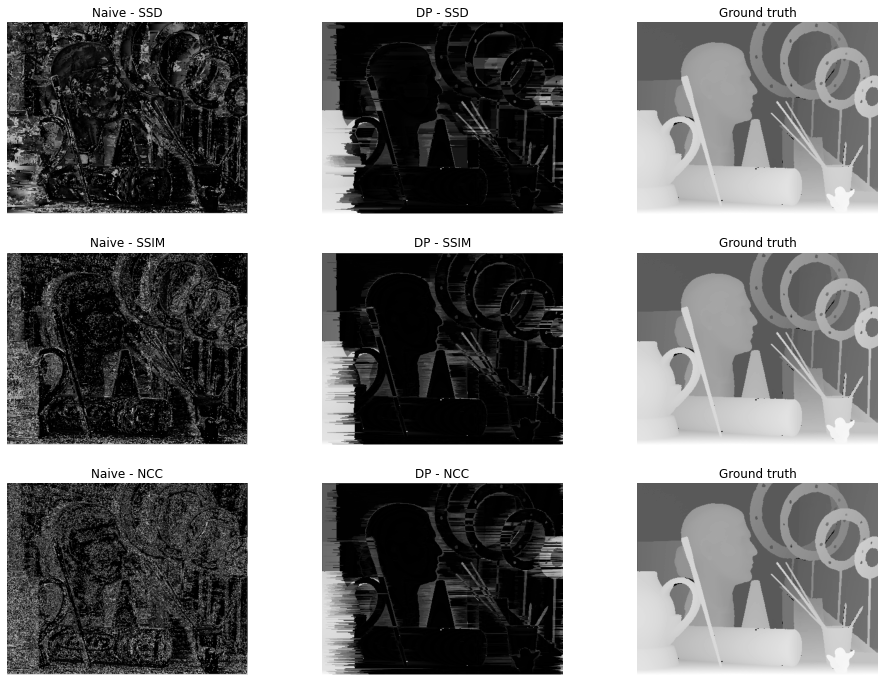

In [23]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)

### 2005 - Books dataset

In [24]:
set = 'Books'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

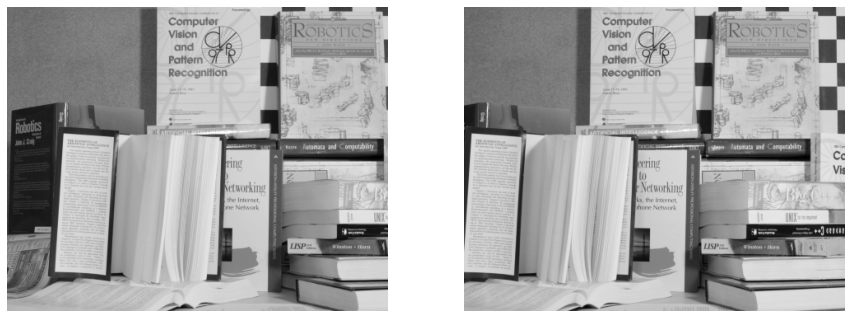

In [25]:
plot_original_images(image1, image2)

In [26]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

In [27]:
naive_disparities_SSD = stereo_estimation_naive(**base_naive_params, window_size=3, metric=1)
dp_disparities_SSD = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=1000, metric=1)

naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)

naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)

#### Quality of disparity images

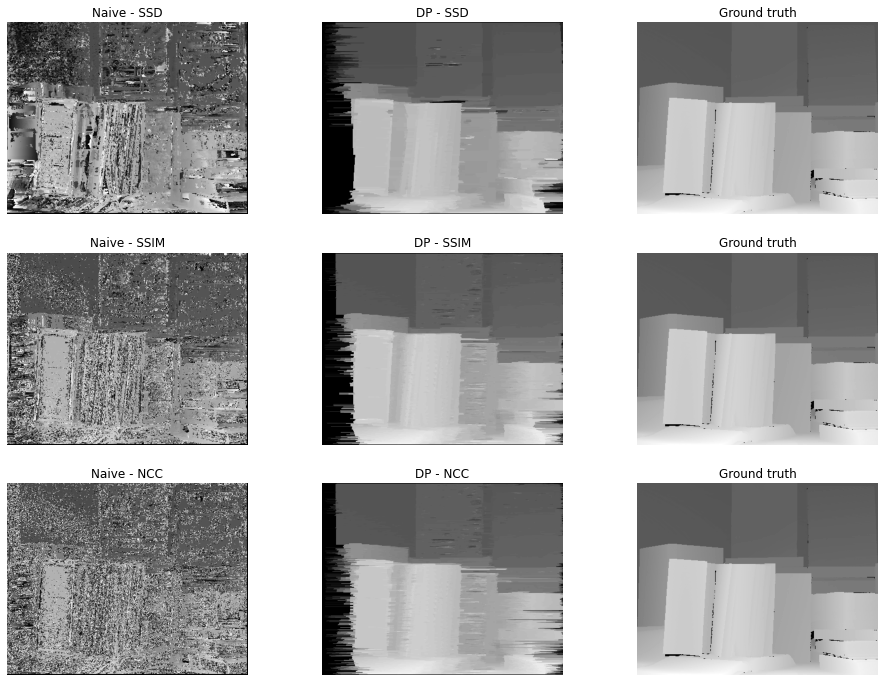

In [28]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

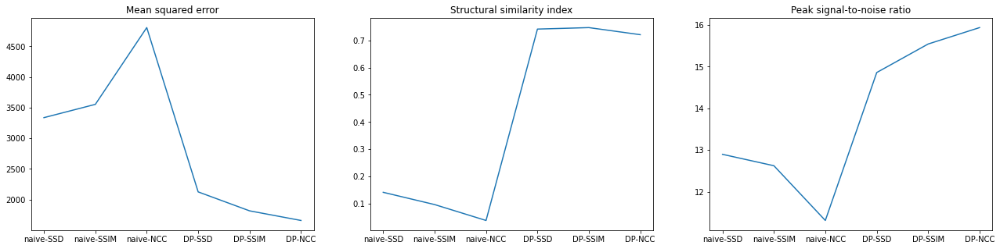

In [29]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

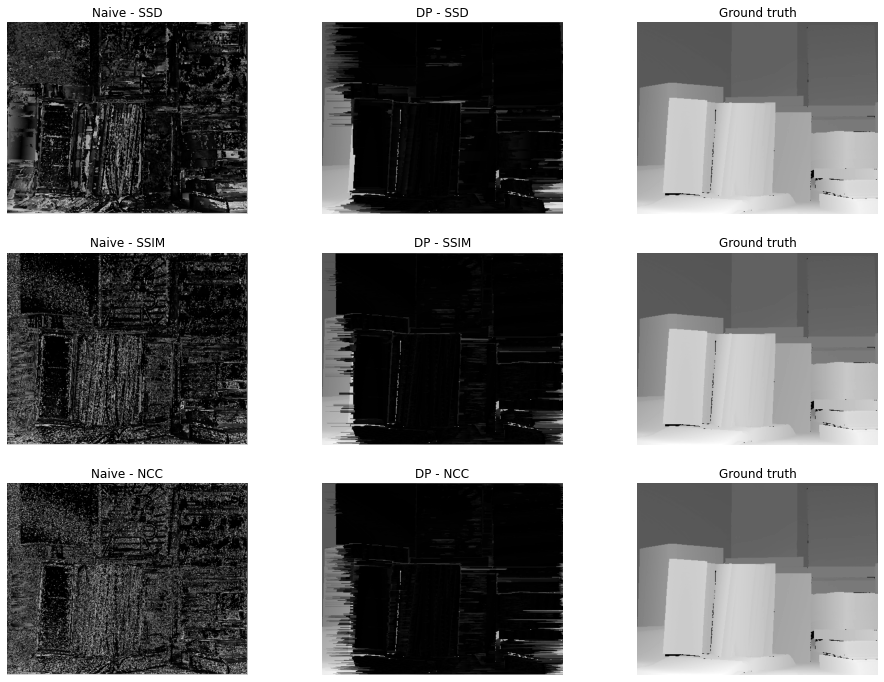

In [30]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)

### 2005 - Dolls dataset

In [31]:
set = 'Dolls'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

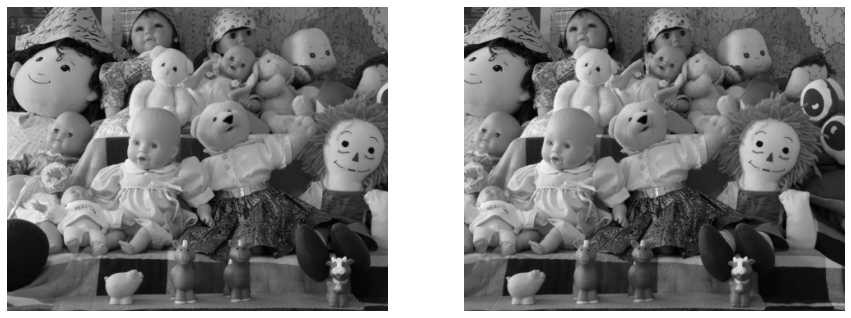

In [32]:
plot_original_images(image1, image2)

In [33]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

In [34]:
naive_disparities_SSD = stereo_estimation_naive(**base_naive_params, window_size=3, metric=1)
dp_disparities_SSD = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=1000, metric=1)

naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)

naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)

#### Quality of disparity images

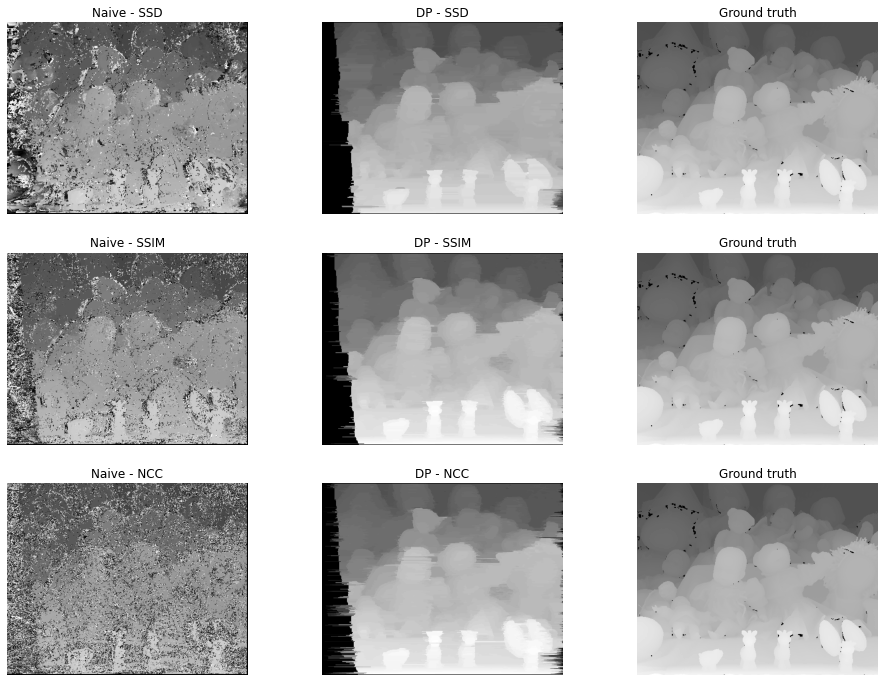

In [35]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

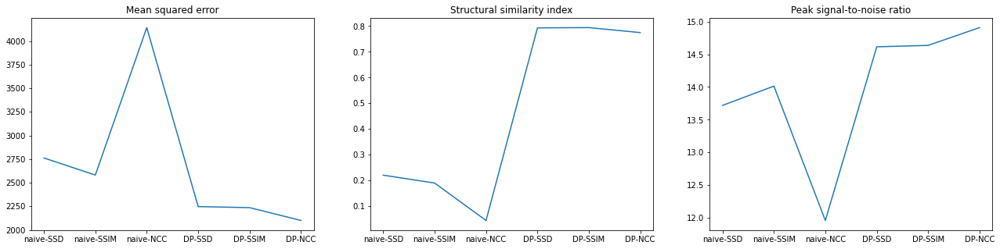

In [36]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

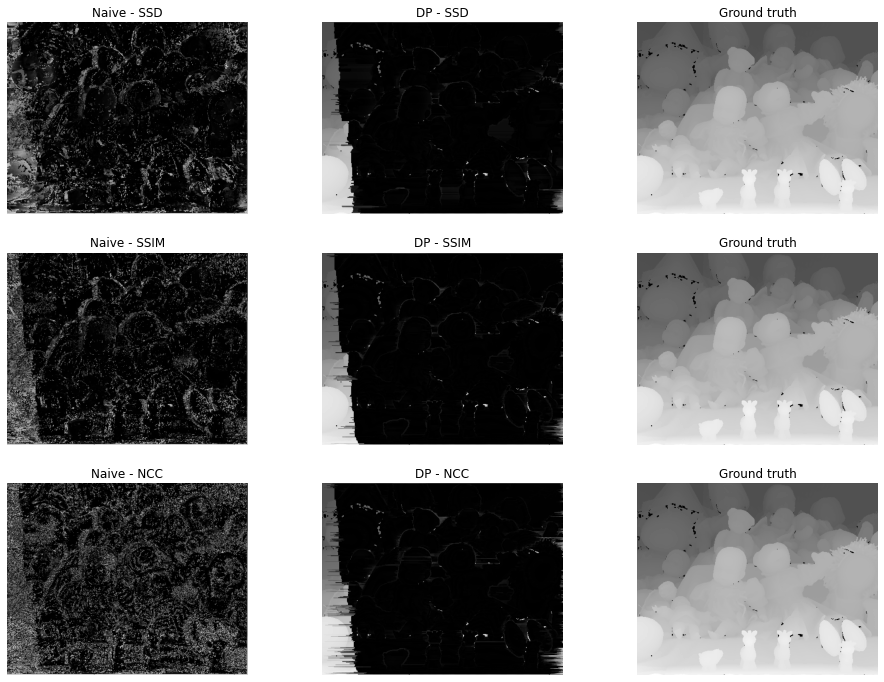

In [37]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)

### 2005 - Laundry dataset

In [38]:
set = 'Laundry'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

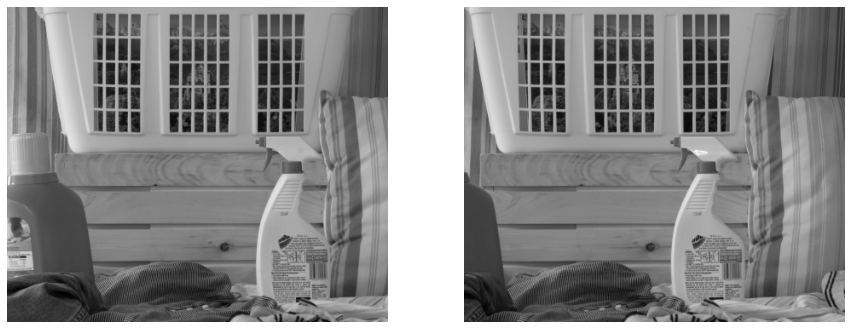

In [39]:
plot_original_images(image1, image2)

In [40]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

In [41]:
naive_disparities_SSD = stereo_estimation_naive(**base_naive_params, window_size=3, metric=1)
dp_disparities_SSD = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=1000, metric=1)

naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)

naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)

#### Quality of disparity images

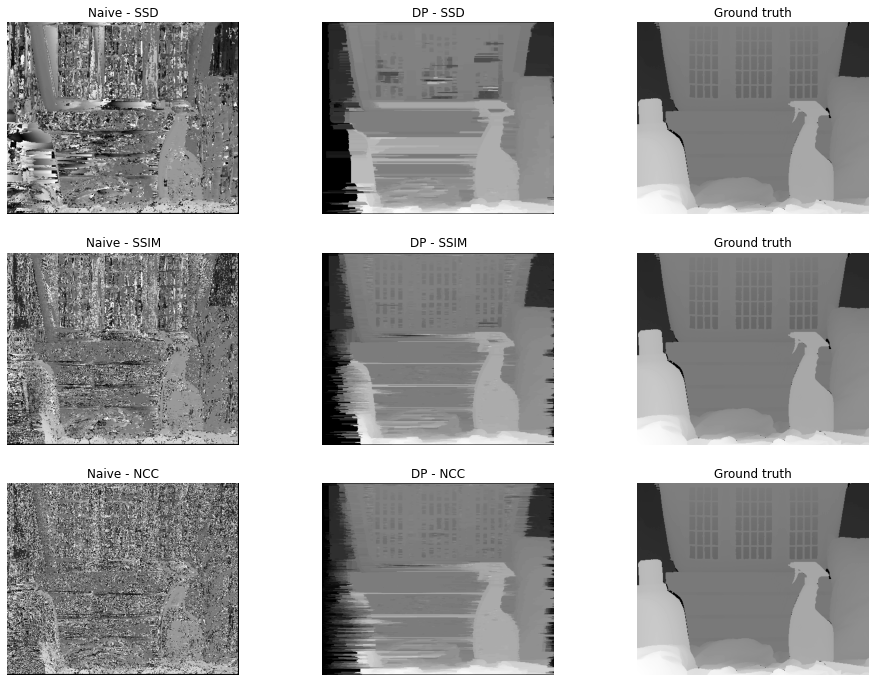

In [42]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

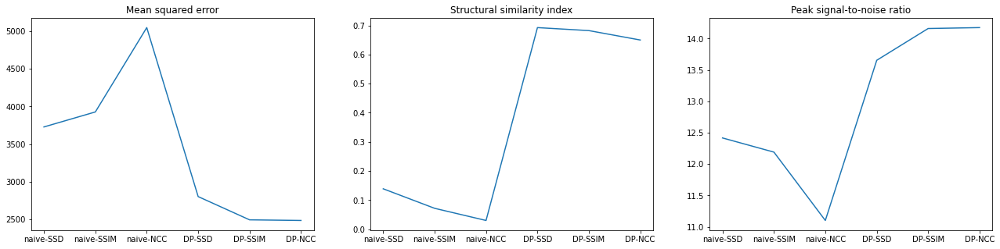

In [43]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

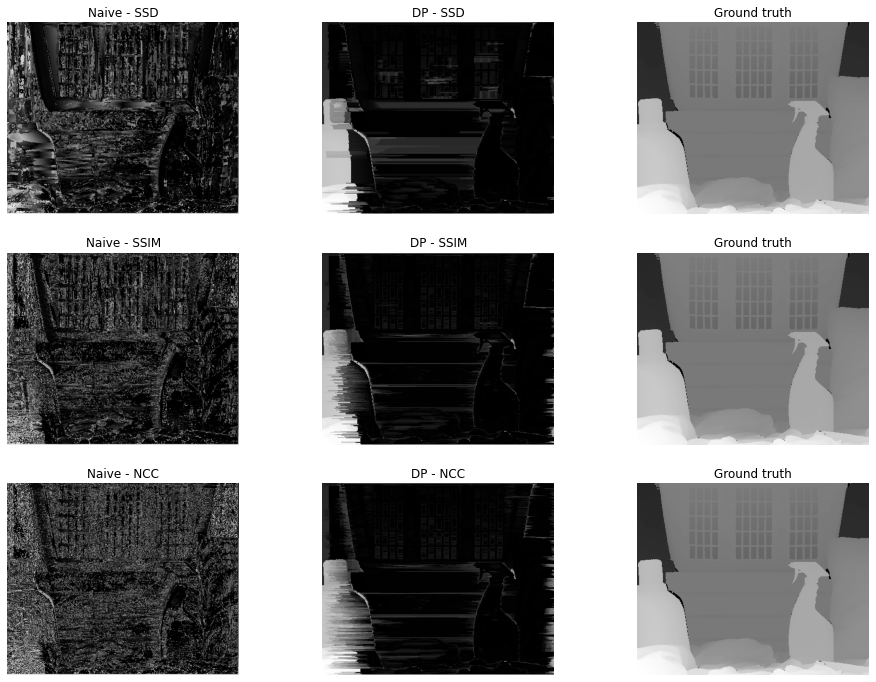

In [44]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)

### 2005 - Moebius dataset

In [45]:
set = 'Moebius'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

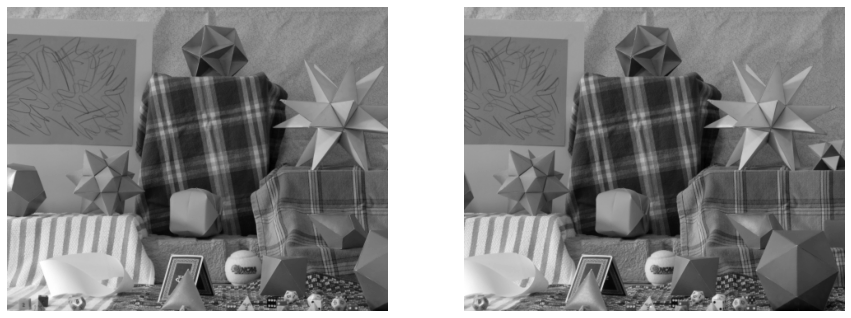

In [46]:
plot_original_images(image1, image2)

In [47]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

In [48]:
naive_disparities_SSD = stereo_estimation_naive(**base_naive_params, window_size=3, metric=1)
dp_disparities_SSD = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=1000, metric=1)

naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)

naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)

#### Quality of disparity images

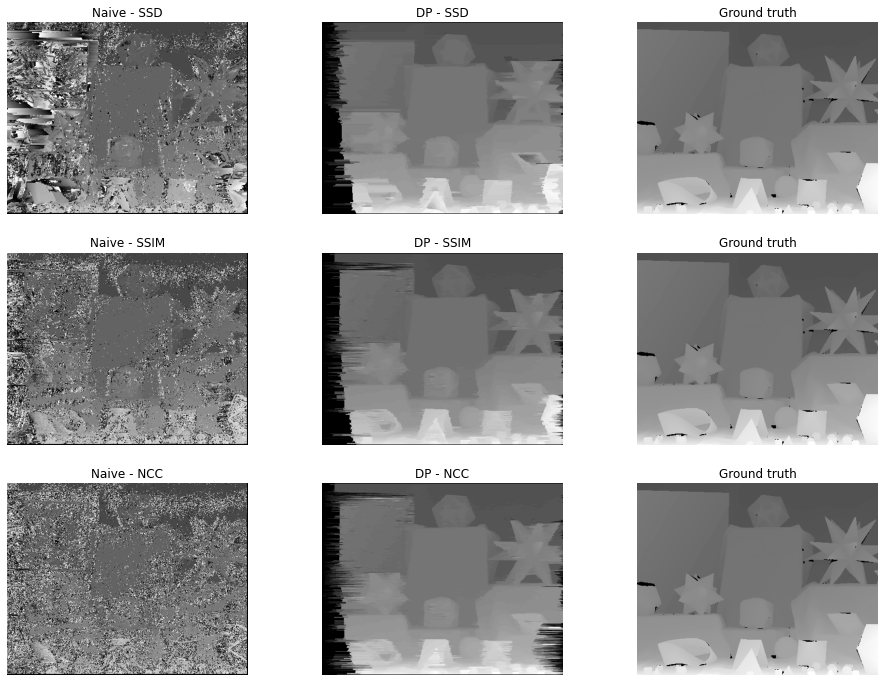

In [49]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

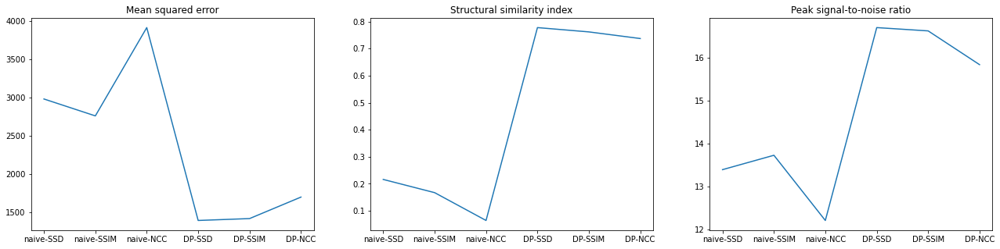

In [50]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

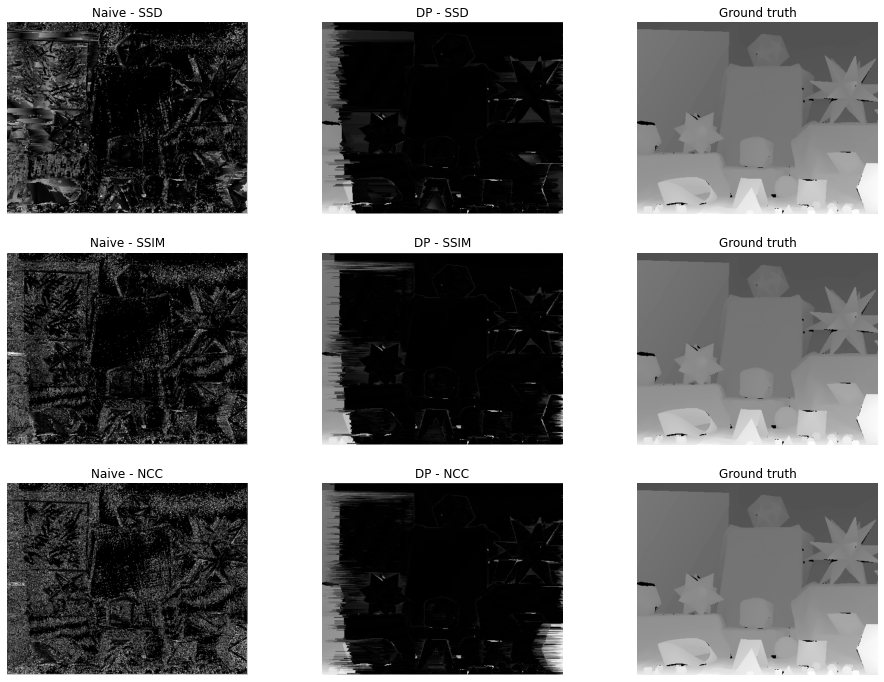

In [51]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)

### 2005 - Reindeer dataset

In [52]:
set = 'Reindeer'
image1 = cv2.imread(f'datasets/{set}/view1.png', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(f'datasets/{set}/view5.png', cv2.IMREAD_GRAYSCALE)

gt1 = cv2.imread(f'datasets/{set}/disp1.png', cv2.IMREAD_GRAYSCALE)
gt2 = cv2.imread(f'datasets/{set}/disp5.png', cv2.IMREAD_GRAYSCALE)

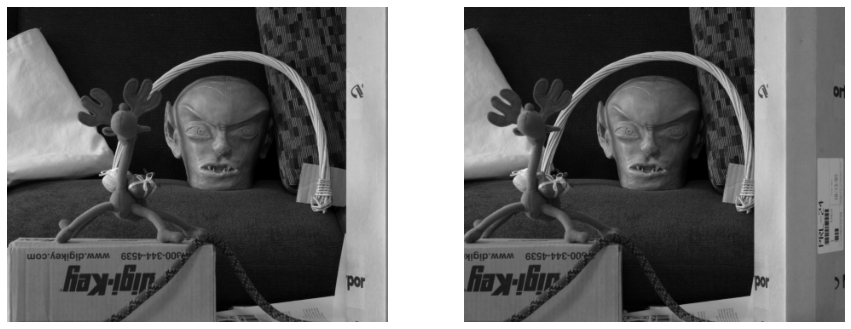

In [53]:
plot_original_images(image1, image2)

In [54]:
base_naive_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)
base_dp_params = dict(height=image1.shape[0], width=image1.shape[1], image1=image1, image2=image2, scale=scale)

In [55]:
naive_disparities_SSD = stereo_estimation_naive(**base_naive_params, window_size=3, metric=1)
dp_disparities_SSD = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=1000, metric=1)

naive_disparities_SSIM = stereo_estimation_naive(**base_naive_params, window_size=3, metric=2)
dp_disparities_SSIM = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=2)

naive_disparities_NCC = stereo_estimation_naive(**base_naive_params, window_size=3, metric=3)
dp_disparities_NCC = stereo_estimation_dp(**base_dp_params, window_size=3, occlusion=0, metric=3)

#### Quality of disparity images

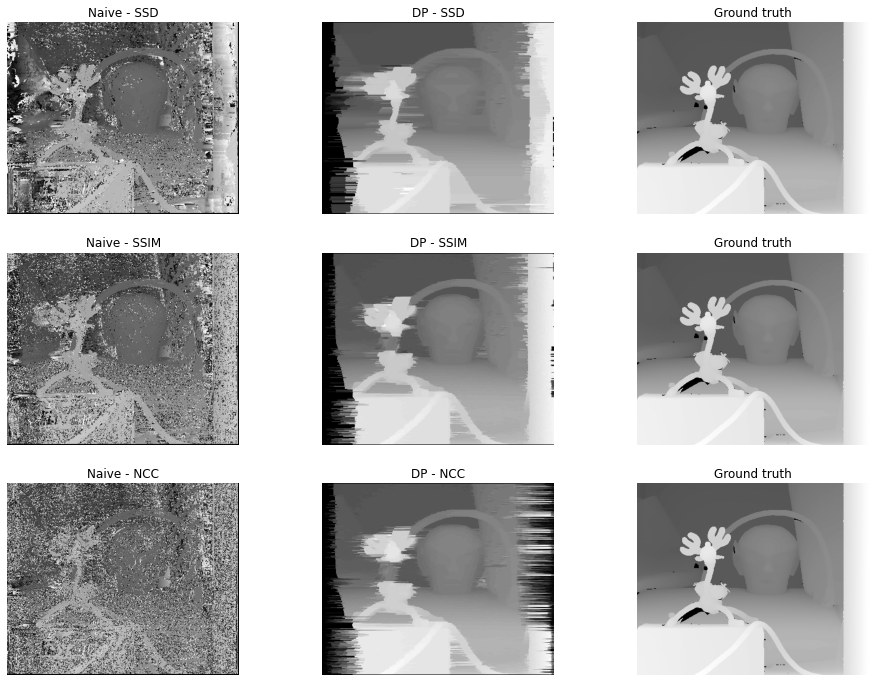

In [56]:
results=[[naive_disparities_SSD, dp_disparities_SSD, gt1],
         [naive_disparities_SSIM, dp_disparities_SSIM, gt1],
         [naive_disparities_NCC, dp_disparities_NCC, gt1]]

plot_disparities(results)

#### Qualitative comparison

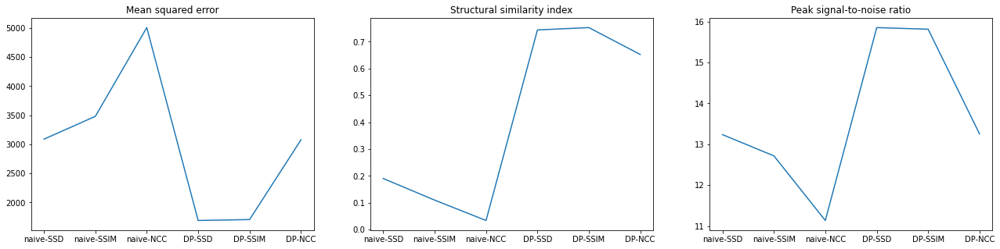

In [57]:
data_MSE=[mean_squared_error(naive_disparities_SSD, gt1), mean_squared_error(naive_disparities_SSIM, gt1), mean_squared_error(naive_disparities_NCC, gt1), 
      mean_squared_error(dp_disparities_SSD, gt1), mean_squared_error(dp_disparities_SSIM, gt1), mean_squared_error(dp_disparities_NCC, gt1)]

data_SSIM=[compare_ssim(naive_disparities_SSD, gt1), compare_ssim(naive_disparities_SSIM, gt1), compare_ssim(naive_disparities_NCC, gt1), 
      compare_ssim(dp_disparities_SSD, gt1), compare_ssim(dp_disparities_SSIM, gt1), compare_ssim(dp_disparities_NCC, gt1)]

data_PSNR=[cv2.PSNR(naive_disparities_SSD, gt1), cv2.PSNR(naive_disparities_SSIM, gt1), cv2.PSNR(naive_disparities_NCC, gt1), 
      cv2.PSNR(dp_disparities_SSD, gt1), cv2.PSNR(dp_disparities_SSIM, gt1), cv2.PSNR(dp_disparities_NCC, gt1)]

plt.figure(figsize=(22,5))

plt.subplot(1, 3, 1)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_MSE)
plt.title('Mean squared error')

plt.subplot(1, 3, 2)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_SSIM)
plt.title('Structural similarity index')

plt.subplot(1, 3, 3)
plt.plot(['naive-SSD', 'naive-SSIM', 'naive-NCC', 'DP-SSD', 'DP-SSIM', 'DP-NCC'], data_PSNR)
plt.title('Peak signal-to-noise ratio')

plt.show()

#### Difference images

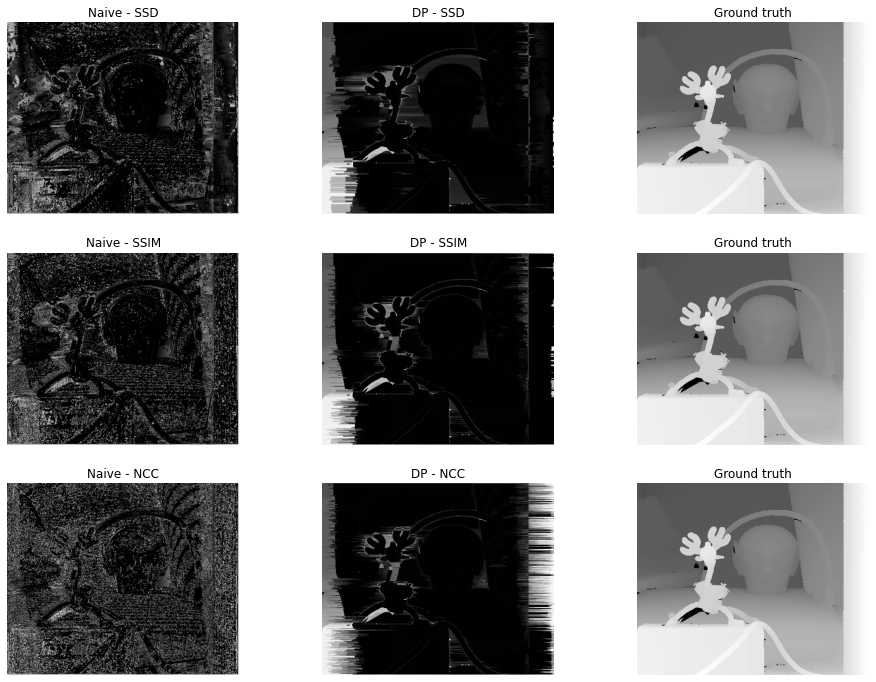

In [58]:
results=[[cv2.absdiff(naive_disparities_SSD, gt1), cv2.absdiff(dp_disparities_SSD, gt1), gt1],
         [cv2.absdiff(naive_disparities_SSIM, gt1), cv2.absdiff(dp_disparities_SSIM, gt1), gt1],
         [cv2.absdiff(naive_disparities_NCC, gt1), cv2.absdiff(dp_disparities_NCC, gt1), gt1]]

plot_difference_images(results)